<a href="https://colab.research.google.com/github/leeyubin10/AutomaticDriving_YOLO/blob/master/YOLO_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2022-02-20 14:14:51--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M   106MB/s    in 2.2s    

2022-02-20 14:14:53 (106 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



In [ ]:
# darknet
# ambulance0.jpg
# labels.zip
# custom_data.data
# custom-train-yolo.cfg

from google.colab import files
files.upload()

Saving darknet to darknet


{'darknet': b'\x7fELF\x02\x01\x01\x03\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00>\x00\x01\x00\x00\x00\xb0\xa3\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x008\xff0\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x008\x00\t\x00@\x00(\x00\'\x00\x06\x00\x00\x00\x04\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x00\x00\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x04\x00\x00\x008\x02\x00\x00\x00\x00\x00\x008\x02\x00\x00\x00\x00\x00\x008\x02\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~2/\x00\x00\x00\x00\x00~2/\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\x00\x00\x98=/\x00\x00\x00\x00\x00\x98=O\x00\x00\x00\x00\x00\x98=O\x00\x00\x00\x00\x00h\x19\x00\x00\x00\x00\x0

#2. Custom YOLO

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!chmod +x ./darknet

chmod: cannot access './darknet': No such file or directory


In [ ]:
!cp -r '/content/drive/MyDrive/darknet/custom/' .
#!cp -r '/content/drive/MyDrive/자율주행/final_data/darknet/custom' .

In [ ]:
!mkdir cfg
!mkdir data

In [ ]:
!cp custom_data.data ./cfg/

In [ ]:
!cp custom-train-yolo.cfg ./cfg/

In [ ]:
!unzip labels.zip -d ./data/

Archive:  labels.zip
   creating: ./data/labels/
  inflating: ./data/labels/118_1.png  
  inflating: ./data/labels/105_4.png  
  inflating: ./data/labels/91_2.png  
  inflating: ./data/labels/123_7.png  
  inflating: ./data/labels/71_7.png  
  inflating: ./data/labels/34_7.png  
  inflating: ./data/labels/57_4.png  
  inflating: ./data/labels/48_3.png  
  inflating: ./data/labels/107_6.png  
  inflating: ./data/labels/121_5.png  
  inflating: ./data/labels/93_0.png  
  inflating: ./data/labels/36_5.png  
  inflating: ./data/labels/73_5.png  
  inflating: ./data/labels/55_6.png  
  inflating: ./data/labels/88_3.png  
  inflating: ./data/labels/68_6.png  
  inflating: ./data/labels/95_6.png  
  inflating: ./data/labels/101_0.png  
  inflating: ./data/labels/53_0.png  
  inflating: ./data/labels/75_3.png  
  inflating: ./data/labels/97_4.png  
  inflating: ./data/labels/125_1.png  
  inflating: ./data/labels/103_2.png  
  inflating: ./data/labels/51_2.png  
  inflating: ./data/labels/77_1

In [ ]:
!wget https://pjreddie.com/media/files/darknet53.conv.74

--2022-02-19 11:31:22--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M   104MB/s    in 1.5s    

2022-02-19 11:31:23 (104 MB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



In [ ]:
!mkdir backup

In [ ]:
!./darknet detector train custom/custom_data.data custom/custom-train-yolo.cfg darknet53.conv.74 -dont_show

custom-train-yolo
layer     filters    size              input                output
   0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32 0.299 BF
   1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64 1.595 BF
   2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32 0.177 BF
   3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1
   5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128 1.595 BF
   6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
   7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5
   9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
  10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
  11 Shortcut Layer: 8
  12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256 1.595 BF
  13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 1

In [ ]:
!./darknet detector map cfg/custom_data.data custom/custom-train-yolo.cfg backup/custom-train-yolo_last.weights

476Cannot load image /content/drive/MyDrive/darknet/custom/bright_high_policeCar95.jpg
480Can't open label file. (This can be normal only if you use MSCOCO): /content/drive/MyDrive/darknet/custom/bright_high_policeCar95.txt 
484^C


In [ ]:
!./darknet detector map cfg/custom_data.data custom/custom-train-yolo.cfg backup/custom-train-yolo_1000.weights

layer     filters    size              input                output
   0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32 0.299 BF
   1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64 1.595 BF
   2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32 0.177 BF
   3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1
   5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128 1.595 BF
   6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
   7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5
   9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
  10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
  11 Shortcut Layer: 8
  12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256 1.595 BF
  13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 128 0.177 BF
  14 c

In [ ]:
!ls -al ./backup

total 481288
drwxr-xr-x 2 root root      4096 Feb 19 13:14 .
drwxr-xr-x 1 root root      4096 Feb 19 13:16 ..
-rw-r--r-- 1 root root 246413088 Feb 19 13:14 custom-train-yolo_1000.weights
-rw-r--r-- 1 root root 246413088 Feb 19 13:14 custom-train-yolo_last.weights


In [ ]:
!./darknet detector test cfg/custom_data.data cfg/custom-train-yolo.cfg backup/custom-train-yolo_last.weights dark_reverse_ambulance80.jpg -thresh 0.3

layer     filters    size              input                output
   0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32 0.299 BF
   1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64 1.595 BF
   2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32 0.177 BF
   3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1
   5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128 1.595 BF
   6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
   7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5
   9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
  10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
  11 Shortcut Layer: 8
  12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256 1.595 BF
  13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 128 0.177 BF
  14 c

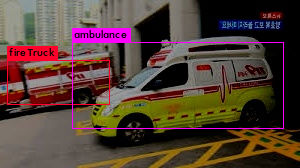

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('predictions.jpg')
cv2_imshow(img)

In [ ]:
!./darknet detector test cfg/custom_data.data cfg/custom-train-yolo.cfg backup/custom-train-yolo_1000.weights policeInRoad.jpeg -thresh 0.6

layer     filters    size              input                output
   0 conv     32  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  32 0.299 BF
   1 conv     64  3 x 3 / 2   416 x 416 x  32   ->   208 x 208 x  64 1.595 BF
   2 conv     32  1 x 1 / 1   208 x 208 x  64   ->   208 x 208 x  32 0.177 BF
   3 conv     64  3 x 3 / 1   208 x 208 x  32   ->   208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1
   5 conv    128  3 x 3 / 2   208 x 208 x  64   ->   104 x 104 x 128 1.595 BF
   6 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
   7 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
   8 Shortcut Layer: 5
   9 conv     64  1 x 1 / 1   104 x 104 x 128   ->   104 x 104 x  64 0.177 BF
  10 conv    128  3 x 3 / 1   104 x 104 x  64   ->   104 x 104 x 128 1.595 BF
  11 Shortcut Layer: 8
  12 conv    256  3 x 3 / 2   104 x 104 x 128   ->    52 x  52 x 256 1.595 BF
  13 conv    128  1 x 1 / 1    52 x  52 x 256   ->    52 x  52 x 128 0.177 BF
  14 c

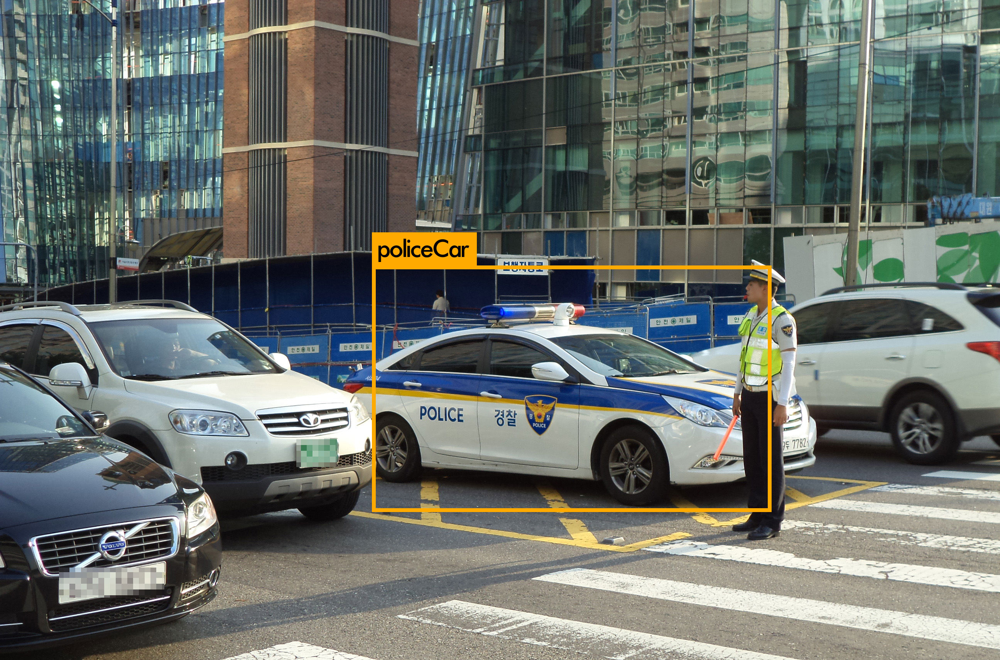

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('predictions.jpg')
cv2_imshow(img)

In [ ]:
!cp -r ./backup/custom-train-yolo_last.weights '/content/drive/MyDrive/AtoI_project/backup'

In [ ]:
!cp -r ./backup/custom-train-yolo_1000.weights '/content/drive/MyDrive/AtoI_project/backup'